# `Crash Course in Causality`

`Name: Ritwik Giri`

`NUID: 002873045`

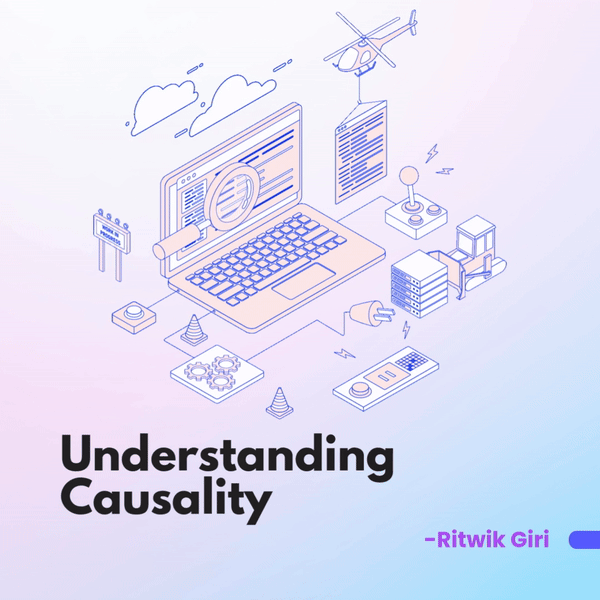

In [81]:

from IPython.display import Image, display

# Display a local GIF
display(Image(filename="/Users/ritwikgiri/Downloads/Title_Causality.gif"))

## Abstract

This notebook presents an in-depth analysis of the **causal impact of pit stop strategies** on race performance in Formula 1, focusing on how decisions regarding the frequency and timing of pit stops influence critical performance metrics. As pit stops are integral to race strategy, their optimization can significantly affect finishing positions, position changes, and race outcomes. By leveraging high-resolution race data across multiple seasons, this study quantifies the role of pit stops while accounting for confounding factors such as starting grid position, constructor performance, and race-specific characteristics.

Using a combination of **Exploratory Data Analysis (EDA)** and advanced **causal inference techniques**, this notebook systematically evaluates the relationships between pit stops and race performance. The Difference-in-Differences (DiD) framework is employed to isolate the causal effects of additional pit stops, revealing their impact relative to drivers with fewer stops. Further, regression-based modeling, with interaction terms, uncovers nuanced insights into how starting grid positions and constructors mediate the effect of pit stops. This robust analytical approach allows for disentangling the direct effects of pit stops from indirect factors such as tire degradation, driver skill, and team strategy.
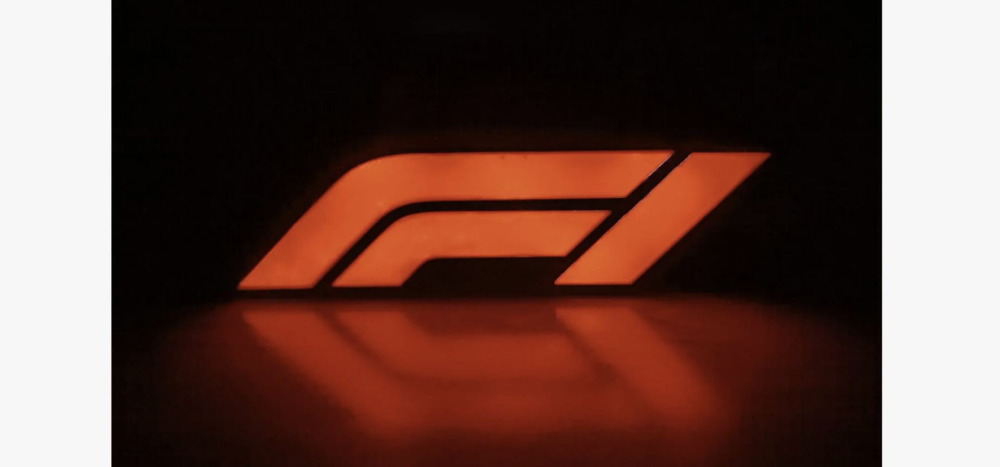

#### Key questions addressed include:

- What is the causal effect of additional pit stops on finishing positions across different races and conditions?
- How do starting grid positions amplify or diminish the impact of pit stop strategies?
- To what extent do constructors and race-specific factors mediate the relationship between pit stops and race outcomes?


## Causality 

**Causality** refers to the relationship between two events, where one event (the cause) directly affects the occurrence of another event (the effect). Unlike correlation, which merely indicates a statistical association between variables, causation establishes a direct cause-and-effect relationship.

Causal analysis seeks to identify genuine cause-and-effect relationships within data. You’ve likely encountered the saying, “correlation does NOT imply causation,” which emphasizes that correlation alone cannot determine what actions will lead to a desired outcome. Often, correlation is influenced by both causal relationships and confounding factors. For instance, consider the observation that individuals who carry lighters are more likely to develop lung cancer. Does carrying a lighter directly cause lung cancer? The answer is no—smoking acts as a confounding variable that explains both the likelihood of carrying lighters and the development of lung cancer.

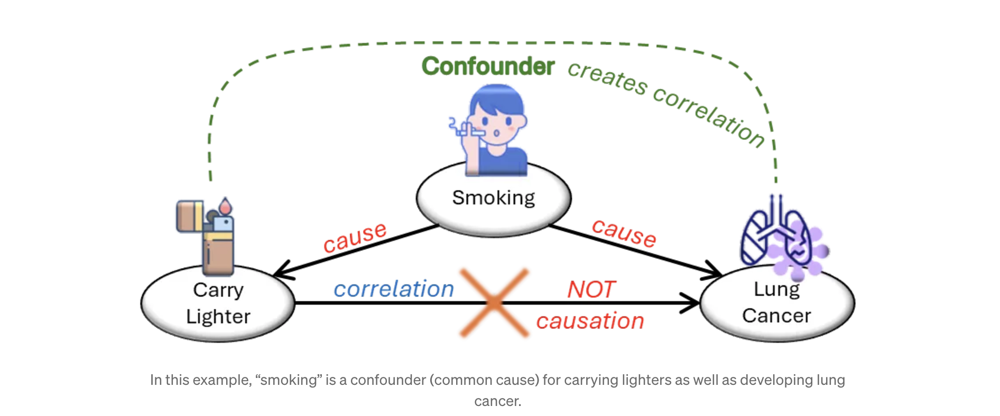

#### **Why Causality Matters?**

Understanding causality is essential for:

1. Making predictions under interventions (e.g., "What happens to race performance if a team switches to soft tires?").
2. Informing decision-making (e.g., "Should we adopt an aggressive tire strategy?").
3. Building robust machine learning models that generalize under real-world changes.


### **Divide and conquer: Categorizing causal questions**

We can broadly summarize some of the causal questions listed above into the following two formats, and in doing so, we then have methodologies available that can help derive causal insights.

**Type 1**: What factors/treatments (Xs) cause the outcome (Y)?

Method: Causal discovery

Business examples:
- What factors are causing a decline in user retention?
- Which marketing channels are driving traffic to our website?

**Type 2**: How much does treatment (X) affect outcome (Y)?

Method: Causal inference

Business examples:
- How much did the new feature increase user engagement?
- What is the impact of a price change on sales volume?
- 
By framing our questions in these formats, we can apply appropriate methodologies to derive causal insights and make informed decisions.

Splitting up causal analysis into its subfields
As we see, causal analysis can be divided into two main subfields, each corresponding to one of the causal questions mentioned above:

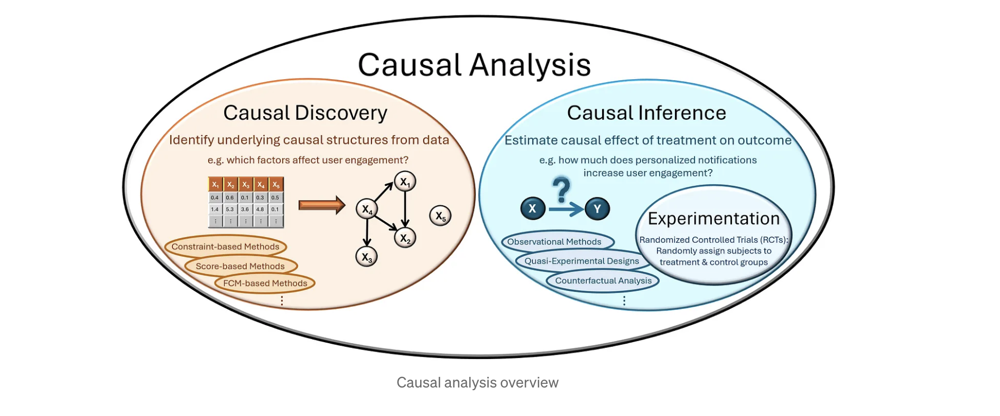

**Causal discovery** involves identifying underlying causal structures from data. 
For example, it helps answer questions such as, “What factors affect user engagement?” by analyzing app data to uncover relationships among variables such as notifications, user interface design, and content loading speed.

**Causal inference** focuses on determining how much specific factors affect an outcome. 
For instance, it can answer questions such as, “How much do personalized push notifications enhance user engagement?” This subfield includes methods like experimentation, where controlled experiments (e.g., randomized controlled trials) are used to establish causality.



## **Principles of Causality**
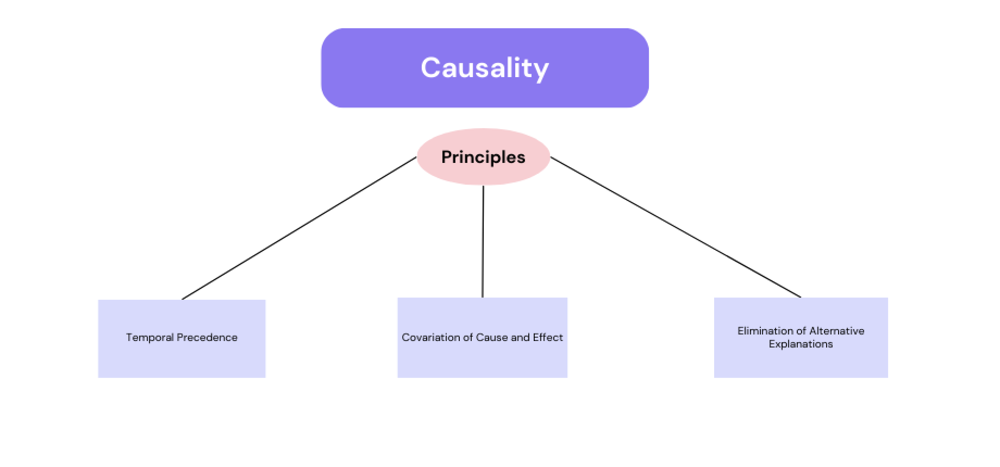

**Temporal Precedence**: The cause must occur before the effect. For instance, administering a drug (cause) should precede the observed health improvement (effect).

**Covariation of Cause and Effect**: There must be a demonstrable association between the cause and the effect. For example, increased physical activity is associated with weight loss.

**Elimination of Alternative Explanations**: It's essential to rule out other factors that could explain the observed relationship. For instance, when studying the effect of a new teaching method on student performance, one must account for variables like prior knowledge and socioeconomic status.


## **Methods of Investigating Causality**
Causality investigates whether one variable directly influences another, going beyond simple correlations. Various methods help establish causal relationships in different contexts.

### 1. **Observational Studies**
**Overview**:
Observational studies involve analyzing naturally occurring data to infer causal relationships. These studies don't involve interventions but instead rely on existing patterns. A critical challenge in observational studies is the presence of confounding variables—factors that affect both the treatment and the outcome.

**Steps in Observational Studies**:
- Identify the variables of interest (treatment and outcome).
- Account for potential confounders using statistical techniques like regression or matching.
- Establish causal direction using domain knowledge or causal diagrams.

Example: Impact of Exercise on Heart Health

Scenario: To study the impact of regular exercise on heart health, researchers use existing health data.

Confounders: Socioeconomic status, diet, and age could influence both exercise frequency and heart health.

Approach: Use statistical controls (e.g., regression analysis) to account for these confounders, isolating the effect of exercise.

### 2. **Randomized Controlled Trials (RCTs)**
**Overview**:
RCTs are the gold standard for causality as they eliminate confounding by randomly assigning subjects to treatment and control groups. This ensures that any difference in outcomes can be attributed to the treatment. However, RCTs are often impractical or unethical in many contexts.

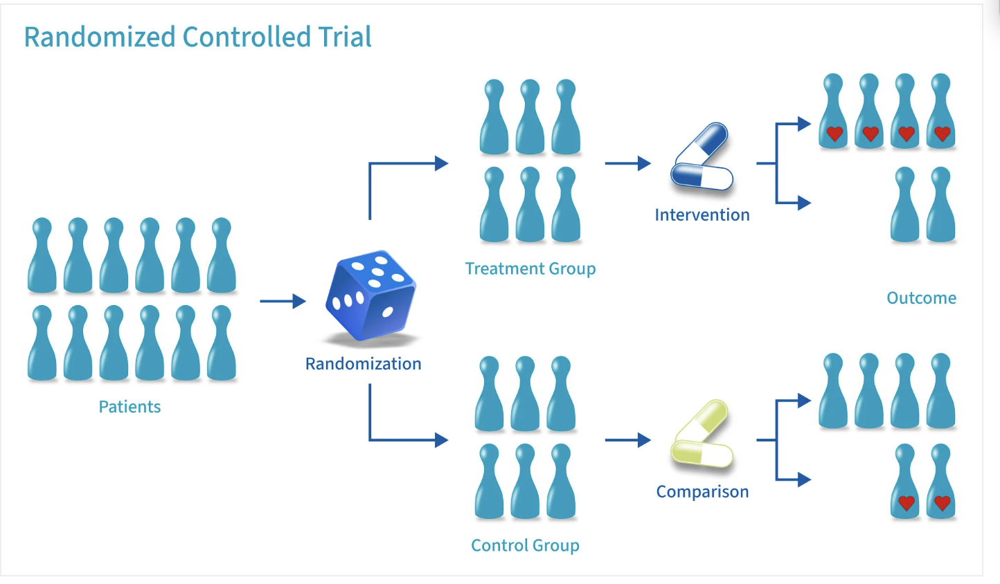

**Steps in RCTs**:
- Randomly assign participants to treatment or control groups.
- Ensure the groups are statistically identical in all aspects except the treatment.
- Measure the outcome after applying the treatment.
  
Example: Effect of a New Medication on Blood Pressure 

Scenario: A pharmaceutical company wants to test a new drug's effectiveness in lowering blood pressure.

Approach: Participants are randomly assigned to receive the drug or a placebo. The difference in blood pressure reduction between the two groups indicates the drug's causal effect.

**Challenges of RCTs**:
Ethical Issues: Testing treatments that withhold potentially life-saving interventions can be problematic.
Practical Limitations: Large-scale RCTs require significant resources.

### 3. **Causal Inference Techniques**
When RCTs are not feasible, causal inference methods are applied to observational data to mimic randomization and establish causality.

#### A. **Propensity Score Matching (PSM)**
**Overview**:
PSM matches treated and untreated subjects with similar characteristics, ensuring comparability between groups.
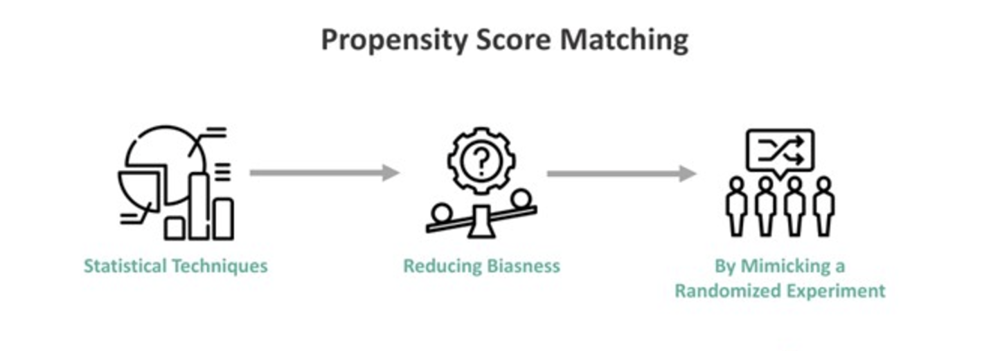
**Steps in PSM**:

- Estimate propensity scores (probability of receiving the treatment) using confounders.
- Match treated and untreated subjects with similar scores.
- Compare outcomes between matched groups.

#### B. **Difference-in-Differences (DiD)**
**Overview**:
DiD evaluates causal effects by comparing changes in outcomes over time between treated and untreated groups. It assumes that, in the absence of treatment, both groups would have experienced similar trends.
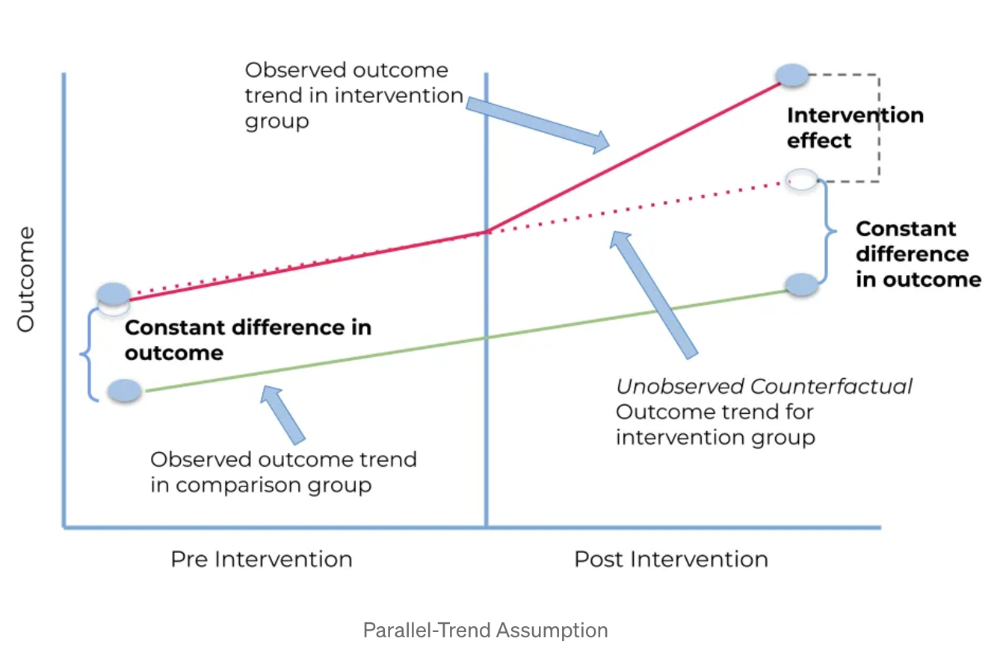
**Steps in DiD**:

- Identify treated and untreated groups.
- Collect data before and after the intervention.
- Calculate the difference in outcomes between the groups and over time.

#### **DiD Equation**:

##### 𝐷𝑖𝐷 = (Post-Treatment Outcome Treated − Pre-Treatment Outcome Treated) − (Post-Treatment Outcome Control − Pre-Treatment Outcome Control)

#### **C. Instrumental Variables (IV)**
**Overview**:
IVs address unobserved confounders by using a variable (instrument) that affects the treatment but not the outcome directly.
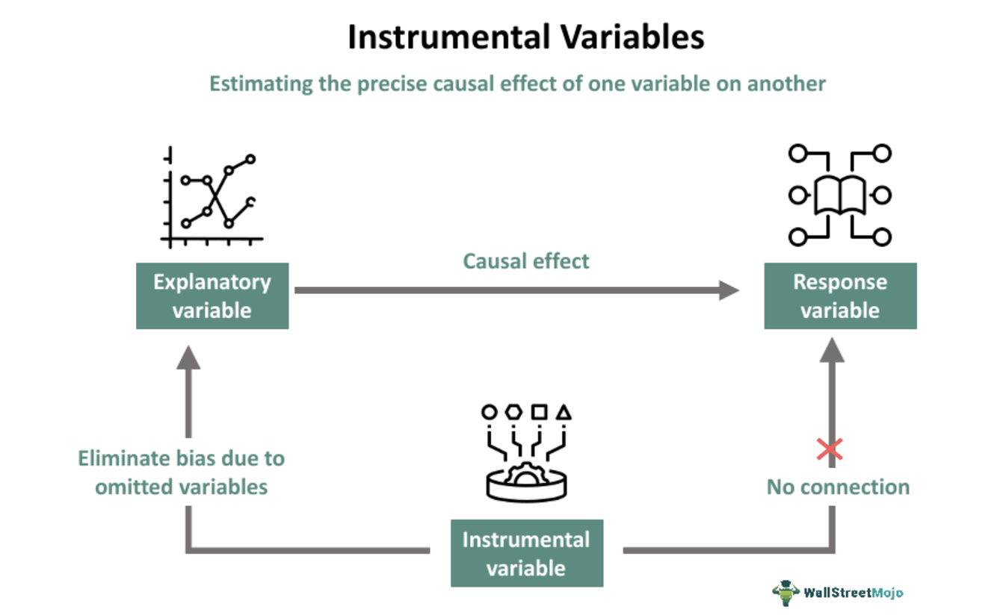
**Steps in IV**:

- Identify a valid instrument.
- Use the instrument to estimate the effect of the treatment on the outcome.




## **How Data Preprocessing Supports Interpreting Causal Relationships**
**Improves Data Quality**: 
- Handling missing data, removing noise, and standardizing features ensure reliable results.

**Enhances Model Interpretability**:
- Properly encoded and selected features make it easier to interpret causal relationships.

**Reduces Bias**:
- Controlling for confounders and addressing outliers minimizes the risk of biased estimates.

**Facilitates Valid Comparisons**:
- Balanced datasets allow for fair comparisons between treatment and control groups, mimicking randomization.


In [115]:
pip install seaborn dowhy requests pandas matplotlib_venn 

Note: you may need to restart the kernel to use updated packages.


# Causality Example in Formula 1

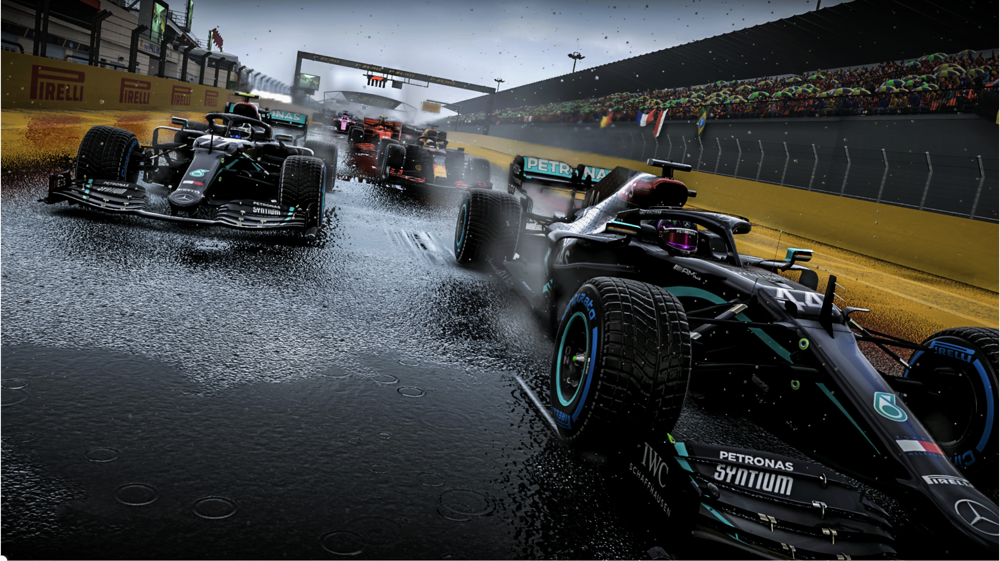

# Fetching data from API

## Race results data for Season 2021 & 2022

In [88]:
import requests
import pandas as pd

# Define the seasons you want to fetch data for
seasons = [2021, 2022]

# Initialize a DataFrame to store results for all seasons
all_results = []

# Loop through each season
for season in seasons:
    base_url = f"https://ergast.com/api/f1/{season}"

    # Fetch race schedule for the season
    schedule_url = f"{base_url}.json"
    response = requests.get(schedule_url)
    if response.status_code == 200:
        races = response.json()['MRData']['RaceTable']['Races']
    else:
        raise Exception(f"Failed to retrieve race schedule for {season}")

    # Loop through all rounds in the season
    for race in races:
        round_number = race['round']
        race_name = race['raceName']
        results_url = f"{base_url}/{round_number}/results.json"
        response = requests.get(results_url)
        
        if response.status_code == 200:
            race_data = response.json()
            results = race_data['MRData']['RaceTable']['Races'][0]['Results']
            
            for result in results:
                all_results.append({
                    'Season': season,
                    'Race Name': race_name,
                    'Round': round_number,
                    'Driver': result['Driver']['familyName'],
                    'Constructor': result['Constructor']['name'],
                    'Position': int(result['position']),
                    'Grid': int(result['grid']),
                    'Points': float(result['points']),
                    'Time': result['Time']['time'] if 'Time' in result else None
                })
        else:
            print(f"Failed to retrieve results for round {round_number} in {season}")

# Convert to DataFrame
df_results = pd.DataFrame(all_results)
print(df_results.head())

# Save the data to a CSV file for later use
df_results.to_csv('f1_results_2021_2022.csv', index=False)


   Season           Race Name Round      Driver Constructor  Position  Grid  \
0    2021  Bahrain Grand Prix     1    Hamilton    Mercedes         1     2   
1    2021  Bahrain Grand Prix     1  Verstappen    Red Bull         2     1   
2    2021  Bahrain Grand Prix     1      Bottas    Mercedes         3     3   
3    2021  Bahrain Grand Prix     1      Norris     McLaren         4     7   
4    2021  Bahrain Grand Prix     1       Pérez    Red Bull         5     0   

   Points         Time  
0    25.0  1:32:03.897  
1    18.0       +0.745  
2    16.0      +37.383  
3    12.0      +46.466  
4    10.0      +52.047  


## Pitstop related data 

In [89]:
# Initialize DataFrame for pit stops
all_pitstops = []

# Loop through all rounds to fetch pit stops
for race in races:
    round_number = race['round']
    race_name = race['raceName']
    pitstop_url = f"{base_url}/{round_number}/pitstops.json"
    response = requests.get(pitstop_url)
    
    if response.status_code == 200:
        pit_data = response.json()
        if len(pit_data['MRData']['RaceTable']['Races']) > 0:
            pitstops = pit_data['MRData']['RaceTable']['Races'][0]['PitStops']
            
            for stop in pitstops:
                all_pitstops.append({
                    'Race Name': race_name,
                    'Round': round_number,
                    'Driver': stop['driverId'],
                    'Stop': int(stop['stop']),
                    'Lap': int(stop['lap']),
                    'Time': stop['time'],
                    'Duration': stop['duration']
                })
    else:
        print(f"Failed to retrieve pit stops for round {round_number}")

# Convert to DataFrame
df_pitstops = pd.DataFrame(all_pitstops)
print(df_pitstops.head())


            Race Name Round           Driver  Stop  Lap      Time Duration
0  Bahrain Grand Prix     1         hamilton     1   11  18:21:54   25.201
1  Bahrain Grand Prix     1           alonso     1   11  18:22:10   25.365
2  Bahrain Grand Prix     1  mick_schumacher     1   12  18:24:08   25.214
3  Bahrain Grand Prix     1            albon     1   13  18:25:47   24.874
4  Bahrain Grand Prix     1   max_verstappen     1   14  18:26:43   24.897


## Merging the two Results and Pitstops

In [90]:
df_results['Driver'] = df_results['Driver'].str.lower()  # Standardize case
df_pitstops['Driver'] = df_pitstops['Driver'].str.lower()

# Merge the results and pit stop data
df_merged = pd.merge(df_results, df_pitstops, how='left', on=['Race Name', 'Round', 'Driver'])

# Display the merged DataFrame
print(df_merged)

# Save the merged dataset for further analysis
df_merged.to_csv('f1_2021_2022_race_results_with_pitstops.csv', index=False)


      Season             Race Name Round      Driver     Constructor  \
0       2021    Bahrain Grand Prix     1    hamilton        Mercedes   
1       2021    Bahrain Grand Prix     1    hamilton        Mercedes   
2       2021    Bahrain Grand Prix     1  verstappen        Red Bull   
3       2021    Bahrain Grand Prix     1      bottas        Mercedes   
4       2021    Bahrain Grand Prix     1      norris         McLaren   
...      ...                   ...   ...         ...             ...   
1043    2022  Abu Dhabi Grand Prix    22   magnussen    Haas F1 Team   
1044    2022  Abu Dhabi Grand Prix    22    hamilton        Mercedes   
1045    2022  Abu Dhabi Grand Prix    22      latifi        Williams   
1046    2022  Abu Dhabi Grand Prix    22      latifi        Williams   
1047    2022  Abu Dhabi Grand Prix    22      alonso  Alpine F1 Team   

      Position  Grid  Points       Time_x  Stop   Lap    Time_y Duration  
0            1     2    25.0  1:32:03.897   1.0  11.0  18:21

## Exploratory Data Analysis (EDA)

### Finding missing values

In [91]:
# Check rows with missing pit stop data
missing_pitstops = df_merged[df_merged['Stop'].isna()]
print("Drivers with missing pit stop data:\n", missing_pitstops[['Race Name', 'Driver']])


Drivers with missing pit stop data:
                  Race Name      Driver
2       Bahrain Grand Prix  verstappen
5       Bahrain Grand Prix       pérez
14      Bahrain Grand Prix   räikkönen
15      Bahrain Grand Prix  giovinazzi
19      Bahrain Grand Prix      vettel
...                    ...         ...
1019  São Paulo Grand Prix   ricciardo
1020  Abu Dhabi Grand Prix  verstappen
1022  Abu Dhabi Grand Prix       pérez
1042  Abu Dhabi Grand Prix  schumacher
1043  Abu Dhabi Grand Prix   magnussen

[516 rows x 2 columns]


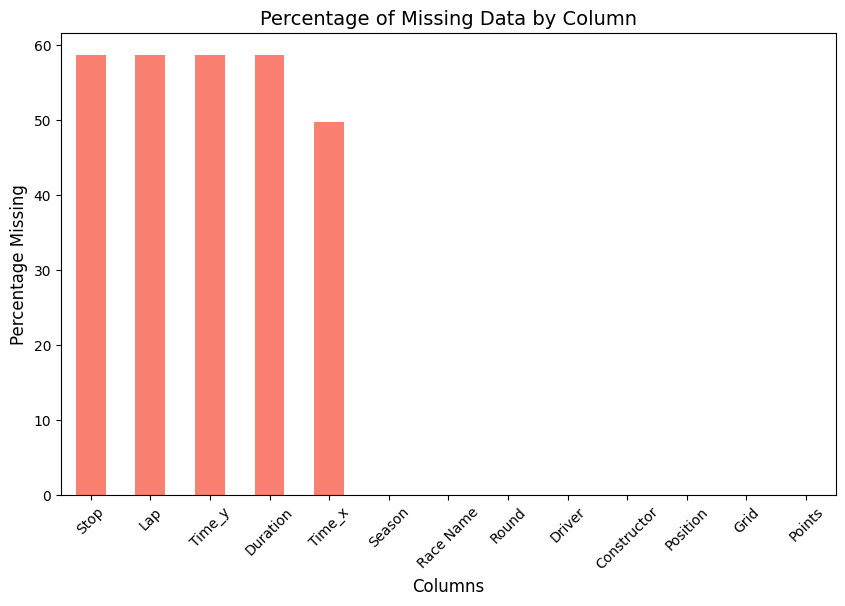

In [93]:
# Calculate missing data percentage
missing_percentage = df_merged.isnull().sum() / len(df_results) * 100

# Bar chart for missing data percentage
plt.figure(figsize=(10, 6))
missing_percentage.sort_values(ascending=False).plot(kind='bar', color='salmon')
plt.title("Percentage of Missing Data by Column", fontsize=14)
plt.xlabel("Columns", fontsize=12)
plt.ylabel("Percentage Missing", fontsize=12)
plt.xticks(rotation=45)
plt.show()


### Observation
The target variable, **Stop** (number of pit stops), contains a significant amount of missing values, which poses a risk of introducing bias and inaccuracies into the analysis. These missing values can result in discrepancies in the causal inferences by distorting the relationship between pit stops and other critical factors, such as race performance and grid position. Therefore, careful handling of these missing values is crucial to ensure the validity and robustness of the analysis results.

In [94]:
overall_mean = df_merged['Stop'].mean()

df_merged['Stop'] = df_merged.groupby('Race Name')['Stop'].transform(
    lambda x: x.fillna(x.mean() if not x.isna().all() else overall_mean)
)
# Check rows with missing pit stop data
missing_pitstops = df_merged[df_merged['Stop'].isna()]
print("Drivers with missing pit stop data:\n", missing_pitstops[['Race Name', 'Driver']])



Drivers with missing pit stop data:
 Empty DataFrame
Columns: [Race Name, Driver]
Index: []


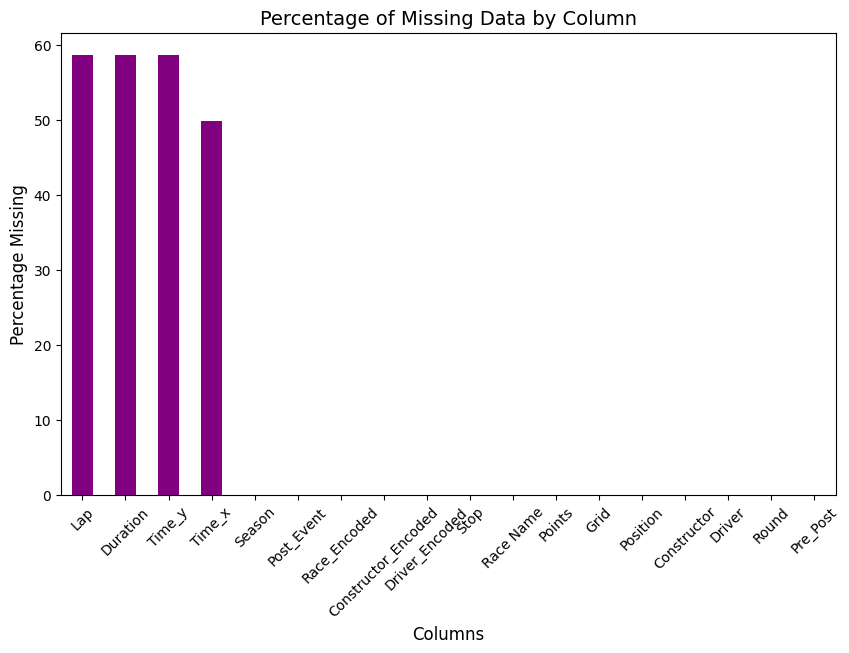

In [116]:
# Calculate missing data percentage
missing_percentage = df_merged.isnull().sum() / len(df_results) * 100

# Bar chart for missing data percentage
plt.figure(figsize=(10, 6))
missing_percentage.sort_values(ascending=False).plot(kind='bar', color='purple')
plt.title("Percentage of Missing Data by Column", fontsize=14)
plt.xlabel("Columns", fontsize=12)
plt.ylabel("Percentage Missing", fontsize=12)
plt.xticks(rotation=45)
plt.show()

In [96]:
pip install scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [97]:
from sklearn.preprocessing import LabelEncoder

# Encode Driver column
le_driver = LabelEncoder()
df_merged['Driver_Encoded'] = le_driver.fit_transform(df_merged['Driver'])

# Encode Constructor column
le_constructor = LabelEncoder()
df_merged['Constructor_Encoded'] = le_constructor.fit_transform(df_merged['Constructor'])

# Encode Race Name column
le_race = LabelEncoder()
df_merged['Race_Encoded'] = le_driver.fit_transform(df_merged['Race Name'])

# Check the result
print(df_merged[['Driver', 'Driver_Encoded', 'Constructor', 'Constructor_Encoded','Race Name','Race_Encoded']].head())


       Driver  Driver_Encoded Constructor  Constructor_Encoded  \
0    hamilton               6    Mercedes                    7   
1    hamilton               6    Mercedes                    7   
2  verstappen              23    Red Bull                    8   
3      bottas               2    Mercedes                    7   
4      norris              13     McLaren                    6   

            Race Name  Race_Encoded  
0  Bahrain Grand Prix             4  
1  Bahrain Grand Prix             4  
2  Bahrain Grand Prix             4  
3  Bahrain Grand Prix             4  
4  Bahrain Grand Prix             4  


 ### Race-Specific Averages

/var/folders/pd/g98v54cj2hbcc0_v9f8067f00000gn/T/ipykernel_88762/686798246.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Race_Encoded', y='Position', data=race_stats, palette='viridis')


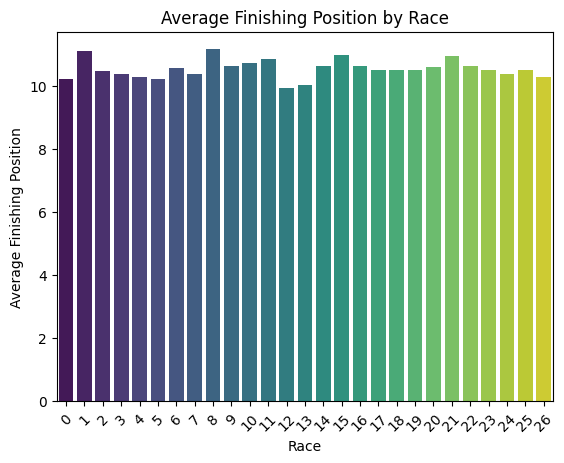

In [108]:
race_stats = df_merged.groupby('Race_Encoded')[['Stop', 'Position']].mean().reset_index()
sns.barplot(x='Race_Encoded', y='Position', data=race_stats, palette='viridis')
plt.title("Average Finishing Position by Race")
plt.xlabel("Race")
plt.ylabel("Average Finishing Position")
plt.xticks(rotation=45)
plt.show()


### Observation
This graph depicts Average Finishing Position by Race that means here we are exploring how the position is affected by the tracks. Further we might establish that because of extra number of turns in some tracks, the braking and tire degradation and the weather conditions increase the number of pit stops and how it is affecting the final race results.

**High Average Finishing Positions in Some Races**
- Some races (e.g. races encoded 9, 13, and 16) have higher average finishing positions compared to others.
Interpretation:
- These races might have more chaotic conditions (e.g., incidents, weather changes, or high tire degradation), leading to worse average positions.
Constructors (Team) or drivers may face specific challenges in these races.

**Low Average Finishing Positions in Other Races**
- Other races (e.g. races encoded 0, 2, and 5) show lower average finishing positions, indicating better overall performance.
Interpretation:
- These races might favor certain constructors, strategies, or have fewer disruptions, allowing for better finishing positions overall.

**Consistency in Middle Races**
- A cluster of races in the mid-range (e.g., races encoded 10–15) appears to have relatively consistent average finishing positions.
Interpretation:
- These races may exhibit standard conditions, where strategy and skill play more predictable roles in determining finishing positions.



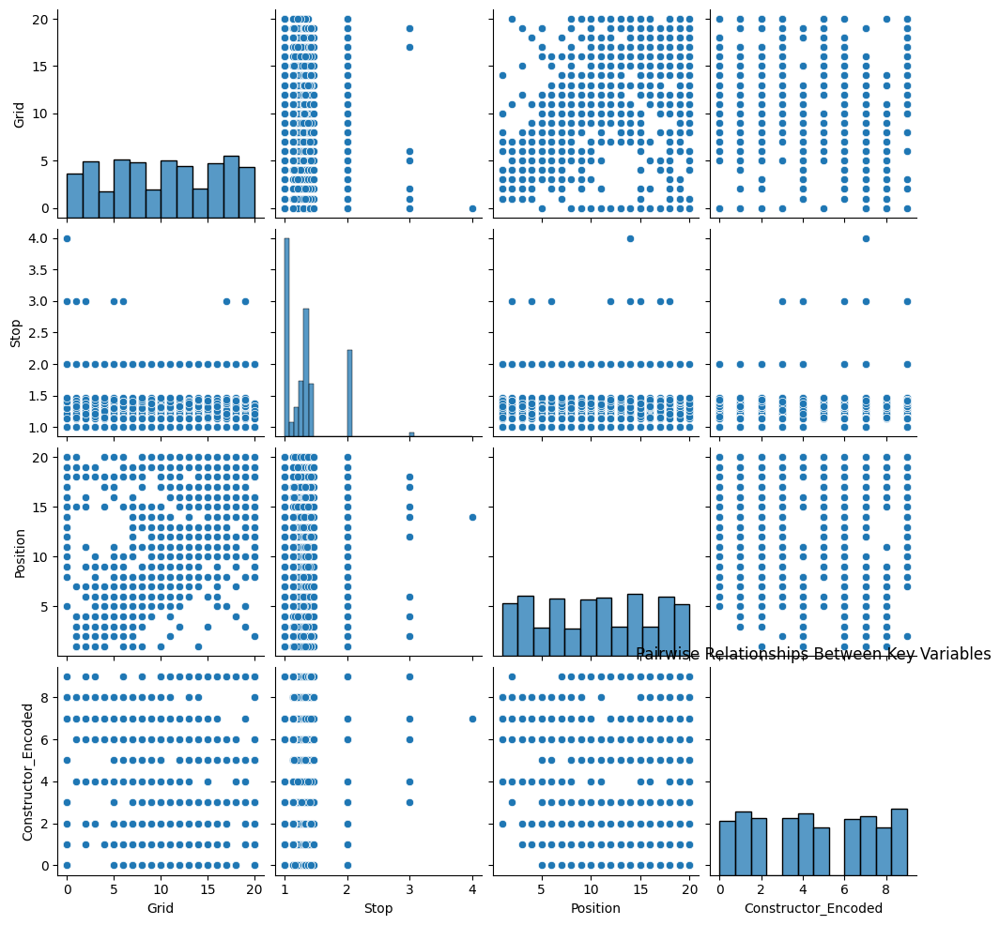

In [109]:
sns.pairplot(df_merged[['Grid', 'Stop', 'Position', 'Constructor_Encoded']])
plt.title("Pairwise Relationships Between Key Variables")
plt.show()

#### **Key Insights from the Visualization**
- Drivers starting closer to the front tend to finish in better positions, confirming the importance of qualifying performance.
-  Additional pit stops negatively impact race performance, likely due to the time lost during stops which make sense. But we will dig into some other factors which cause additional pit stops.
-  Starting position does not directly influence the number of pit stops, which may depend more on strategy or track-specific factors.
-   There is some clustering in the relationship between Constructor_Encoded (team) and Position. Certain constructors consistently achieve better finishing positions, highlighting the role of team performance and car design.
-   There does not appear to be a strong relationship between constructor encoding and the number of pit stops. Teams may employ different pit stop strategies, but these strategies do not show a direct correlation with constructor performance
-  The histogram for Stop shows that most drivers have 1–2 pit stops, with fewer races involving 3 or more stops.This suggests that pit stop strategies in Formula 1 generally focus on minimizing stops, aligning with the observation that fewer stops lead to better performance.
-  The histogram for Position shows clustering at the top positions, with fewer drivers finishing in worse positions. This reflects the competitive nature of Formula 1, where better drivers/constructors consistently perform well.

# Causal Discovery

**DoWhy** is a Python library designed for causal inference, which helps in understanding and estimating the causal relationships between variables in a dataset. Unlike traditional statistical or machine learning methods that focus on correlation, DoWhy emphasizes causation, making it particularly useful in fields like healthcare, economics, and experimental sciences.

DoWhy provides a framework that integrates causal reasoning into data analysis. It allows for:
- **Model Specification**: Using a causal graph (or DAG) to define relationships between treatment, outcome, and confounders.
- **Identification**: Determining whether a causal effect can be estimated based on the provided graph and data.
- **Estimation**: Quantifying the causal effect using statistical or machine learning methods.
- **Refutation**: Validating the causal effect estimation by testing assumptions.
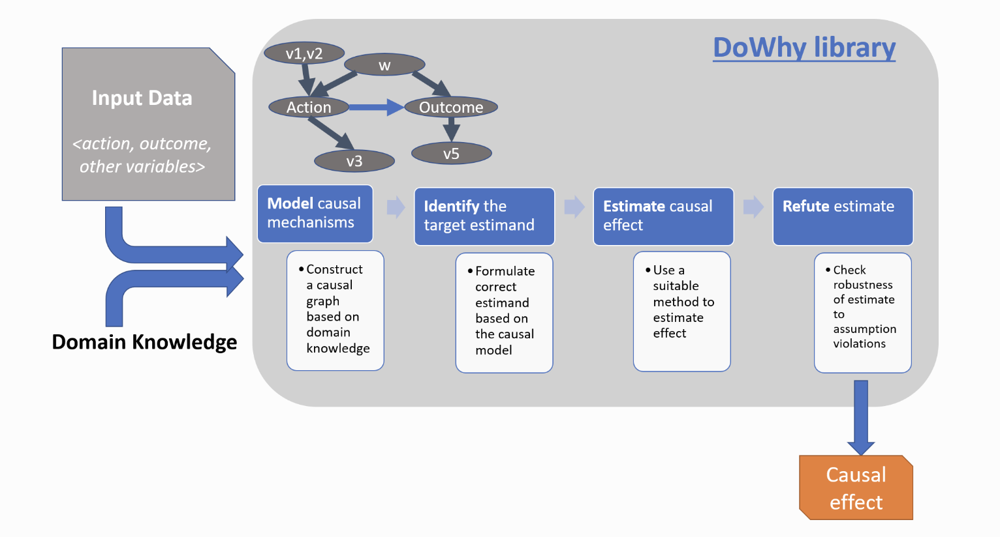

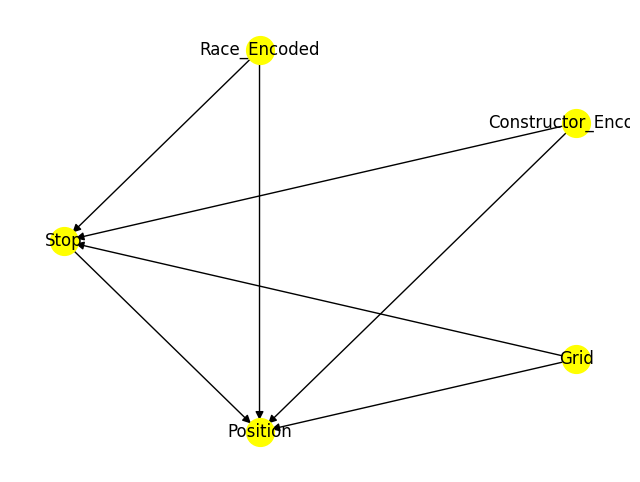

In [99]:
import dowhy
from dowhy import CausalModel


# Example data (replace with your actual dataset)
df = df_merged[['Grid', 'Stop', 'Position', 'Constructor_Encoded', 'Race_Encoded']]

# Define the causal model
model = CausalModel(
    data=df,
    treatment="Stop",            # Treatment variable
    outcome="Position",          # Outcome variable
    common_causes=["Grid", "Constructor_Encoded", "Race_Encoded"]  # Confounders
)

# Visualize the causal graph
model.view_model()


**`Stop → Position`**:
Suggests that the number of pit stops directly affects finishing position.

**`Grid → Position`**:
Indicates that starting grid position has a direct influence on finishing position.

**`Constructor_Encoded → Position`**:
Highlights that the constructor (team) plays a role in determining finishing position.

**`Race_Encoded → Stop`**:
Suggests that the race track influences the number of pit stops, likely due to track-specific characteristics (e.g., high tire wear).

# Causal Inference

### Difference-in-Differences (DiD) Model

This study leverages the **Difference-in-Differences (DiD)** methodology to analyze the causal impact of pit stop frequency on race performance in Formula 1. By comparing drivers with more than one pit stop (treated group) against those with one or no pit stops (control group), the model investigates how additional pit stops affect finishing positions under varying conditions.

The **treatment** `(Post_Event)` represents drivers who made more than one pit stop during the race, while the **time period** `(Pre_Post)` is defined based on the drivers’ starting grid positions. Drivers starting in the **top 10 grid positions** are categorized as the "Pre-event" period, representing a competitive advantage at the start of the race. In contrast, drivers starting outside the top 10 are categorized as the "Post-event" period, capturing a relative disadvantage due to their starting position.

By incorporating interaction terms between treatment and time period, the DiD model isolates the **causal effect of additional pit stops** on race performance, controlling for critical factors such as starting grid position and constructor performance. The results provide insights into how race dynamics evolve based on pit stop strategies, qualifying performance, and team competitiveness.



In [100]:
import statsmodels.api as sm
import statsmodels.formula.api as smf
# Create a treatment variable (Post_Event: 1 for more than 1 stop, 0 otherwise)
df_merged['Post_Event'] = (df_merged['Stop'] > 1).astype(int)

# Create a pre/post time period variable
df_merged['Pre_Post'] = df_merged['Grid'].apply(lambda x: 'Pre' if x <= 10 else 'Post')

# Calculate average positions for treated and control groups
did_model = smf.ols(
    'Position ~ Post_Event * Pre_Post + Grid + Constructor_Encoded',
    data=df_merged
).fit()

# Print results
print(did_model.summary())

                            OLS Regression Results                            
Dep. Variable:               Position   R-squared:                       0.306
Model:                            OLS   Adj. R-squared:                  0.303
Method:                 Least Squares   F-statistic:                     91.88
Date:                Mon, 02 Dec 2024   Prob (F-statistic):           3.47e-80
Time:                        01:31:28   Log-Likelihood:                -3118.0
No. Observations:                1048   AIC:                             6248.
Df Residuals:                    1042   BIC:                             6278.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept           

#### **Key Components in the Result**

- This is the key term in the DiD model. It represents the difference in the difference for treated drivers (those with more pit stops) before and after the event.
The negative coefficient suggests that the impact of pit stops on finishing position is reduced in the post-treatment period.
The p-value (0.054) is borderline significant, implying a weak but noticeable effect.
- Indicates the average effect of being in the treated group (i.e., having more pit stops) on finishing position.
The positive coefficient suggests that having more pit stops tends to worsen finishing positions (higher position numbers).
This result is statistically significant (p-value < 0.05), showing a clear negative impact of more pit stops on race results.
- Indicates that starting grid position has a significant and positive impact on finishing position.
A higher grid position (closer to the front) improves race outcomes, as expected.
- Suggests that the constructor (team) influences finishing positions.
A negative coefficient means that higher-performing constructors (lower encoded values) tend to achieve better results.

#### **Insights**

**Effect of Pit Stops**:

- The significant positive coefficient for `Post_Event` confirms that having more pit stops worsens race outcomes, leading to higher (worse) finishing positions.
- This suggests that minimizing pit stops (when feasible) is critical for improving race performance.

**Interaction Term**:

- The interaction term (`Post_Event:Pre_Post`) being negative and borderline significant suggests that the negative impact of pit stops may diminish in the post-event period.
- Possible explanation: Drivers with more pit stops might recover some lost positions through strategic timing (e.g., fresher tires in the later stages of the race).

**Starting Grid Position**:

- The significant and positive coefficient for Grid reiterates the importance of starting closer to the front. Drivers in higher grid positions consistently achieve better finishing results.
  
**Constructor Performance**:

- Constructor differences play a meaningful role in race outcomes. Teams with stronger constructors (lower encoded values) have a competitive advantage, possibly due to better car reliability or race strategies.


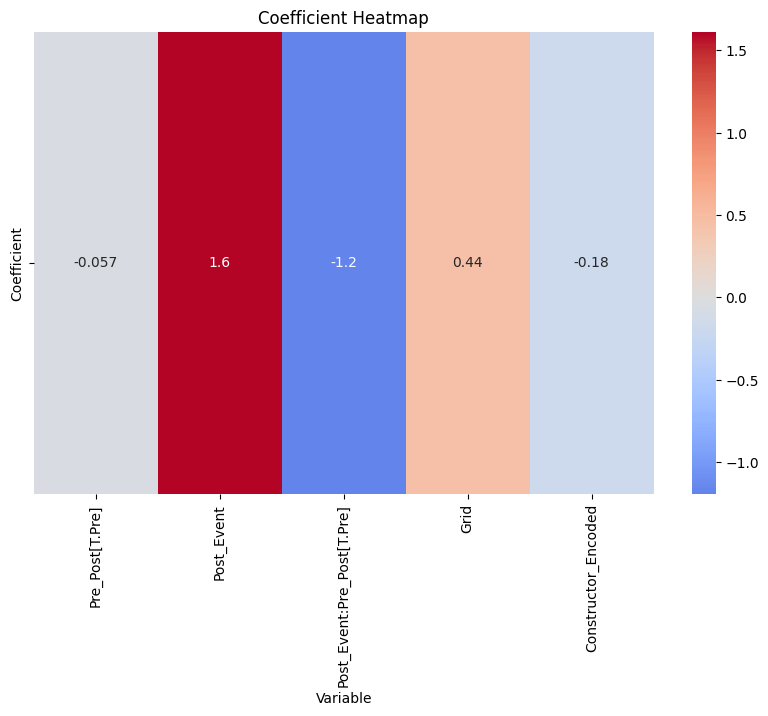

In [101]:
# Extract coefficients and p-values from the model
coef_df = pd.DataFrame({
    'Variable': did_model.params.index,
    'Coefficient': did_model.params.values,
    'P-Value': did_model.pvalues.values
})

# Filter out the intercept for visualization
coef_df = coef_df[coef_df['Variable'] != 'Intercept']

# Create a heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(
    coef_df.set_index('Variable')[['Coefficient']].T,
    annot=True,
    cmap='coolwarm',
    center=0,
    cbar=True
)
plt.title("Coefficient Heatmap")
plt.show()


### **Observations**
- **Post_Event**: Additional pit stops negatively impact race outcomes, supporting the hypothesis that minimizing pit stops is critical for improving performance.
- **Interaction Term: Post_Event:Pre_Post**
The negative coefficient for this interaction term suggests that the negative impact of pit stops diminishes in the post-event period, possibly due to strategic factors like better tire management or fresher tires.
While borderline significant, it highlights a potential mitigating effect of race strategies in the later stages of the race.
- **Grid**:
The positive coefficient for Grid confirms that starting further back on the grid correlates with worse finishing positions.
Key Insight: Qualifying performance remains a significant determinant of race outcomes, as starting closer to the front provides a clear advantage.

- **Constructor_Encoded**:The negative coefficient for Constructor_Encoded shows that better-performing constructors (lower encoded values) are associated with better finishing positions.
Key Insight: Constructor performance plays an essential role in determining race results, highlighting the influence of car reliability, speed, and team strategy

The heatmap effectively visualizes the strength and direction of relationships between key variables and finishing position. These findings provide actionable insights for optimizing race strategies, particularly in balancing pit stops, qualifying performance, and leveraging constructor advantages.

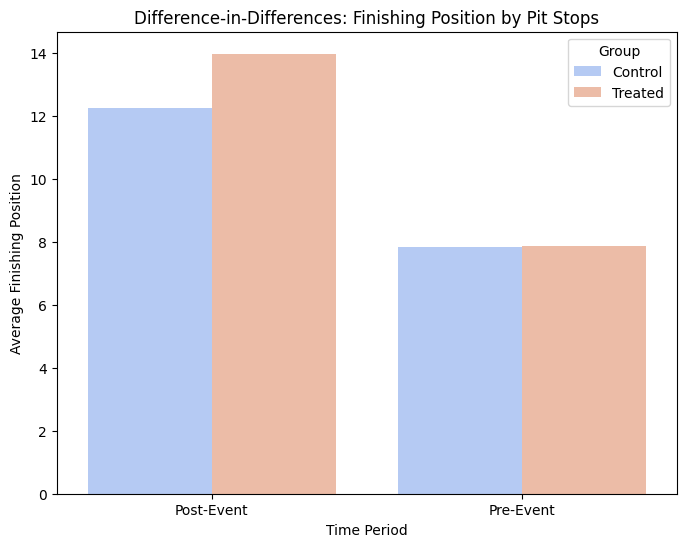

In [102]:
# Create a grouped dataset for visualization
avg_positions = (
    df_merged.groupby(['Post_Event', 'Pre_Post'])['Position']
    .mean()
    .reset_index()
)

# Rename for clarity
avg_positions['Group'] = avg_positions['Post_Event'].map({1: 'Treated', 0: 'Control'})
avg_positions['Period'] = avg_positions['Pre_Post'].map({'Pre': 'Pre-Event', 'Post': 'Post-Event'})

# Barplot for DiD interaction
plt.figure(figsize=(8, 6))
sns.barplot(x='Period', y='Position', hue='Group', data=avg_positions, palette='coolwarm')
plt.title("Difference-in-Differences: Finishing Position by Pit Stops")
plt.xlabel("Time Period")
plt.ylabel("Average Finishing Position")
plt.legend(title="Group")
plt.show()


## Observation from the Visualization

**Treated vs. Control Groups Pre-Event**:
- Before the event, there is a small difference in the average finishing positions between the treated group (drivers with more pit stops) and the control group (drivers with fewer pit stops).
- This suggests that prior to the event, the treated and control groups performed relatively similarly in terms of finishing positions.

**Treated vs. Control Groups Post-Event**:
- After the event, the treated group (drivers with more pit stops) shows a worse average finishing position compared to the control group (higher position numbers indicate worse results).
- This highlights the negative impact of additional pit stops on race performance.

**Impact of the Event (Post-Event Difference)**:
- The control group maintains relatively stable performance before and after the event, suggesting no significant impact on their finishing positions.
- In contrast, the treated group experiences a noticeable decline in performance post-event, indicating that additional pit stops are detrimental to finishing position.

**Difference-in-Differences Effect**:
- The greater divergence between the treated and control groups post-event compared to pre-event validates the causal impact of pit stops on race performance.
- This supports the hypothesis that more pit stops lead to worse race outcomes, even after accounting for starting grid position and constructor differences.


In [103]:
pip install linearmodels

Note: you may need to restart the kernel to use updated packages.


###  Instrumental Variables (IV) Model

This study employs the **Instrumental Variables (IV)** methodology to estimate the causal effect of pit stop frequency (`Stop`) on race performance (`Position`) in Formula 1. The number of pit stops is treated as an endogenous variable, as it is influenced by unobserved factors such as tire degradation, driver skill, or in-race incidents that also directly affect race performance.

To address this endogeneity, `Race_Encoded` is used as an instrument for `Stop`. The instrument captures race-specific characteristics (e.g., track type, layout, and conditions) that influence pit stop strategies without directly impacting the finishing position, except through the number of pit stops. By leveraging `Race_Encoded` as an instrument, the IV model isolates the causal impact of pit stops while controlling for confounding variables such as starting grid position (`Grid`) and constructor performance (`Constructor_Encoded`).

This approach provides insights into how additional pit stops affect finishing positions after accounting for confounders. The findings highlight the trade-offs of pit stop strategies, emphasizing the importance of minimizing unnecessary stops to optimize race performance

In [104]:
from linearmodels.iv import IV2SLS

# Define the formula for the IV model
iv_model = IV2SLS.from_formula(
    "Position ~ 1 + [Stop ~ Race_Encoded] + Grid + Constructor_Encoded",
    data=df_merged
)

# Fit the model
iv_results = iv_model.fit()

# Print the summary
print(iv_results.summary)


                          IV-2SLS Estimation Summary                          
Dep. Variable:               Position   R-squared:                      0.2846
Estimator:                    IV-2SLS   Adj. R-squared:                 0.2825
No. Observations:                1048   F-statistic:                    371.17
Date:                Mon, Dec 02 2024   P-value (F-stat)                0.0000
Time:                        01:31:29   Distribution:                  chi2(3)
Cov. Estimator:                robust                                         
                                                                              
                                  Parameter Estimates                                  
                     Parameter  Std. Err.     T-stat    P-value    Lower CI    Upper CI
---------------------------------------------------------------------------------------
Intercept               3.0343     38.214     0.0794     0.9367     -71.863      77.932
Grid            

### **Key Results**
**R-squared (0.2846)**:

- About 28.46% of the variation in Position (finishing position) is explained by the model.
- While this indicates a moderate fit, it’s not unusual for real-world racing data, where unmeasured factors (e.g., driver skill, weather) play a significant role.

**F-statistic (371.17)**:
- The high F-statistic with a P-value of 0.0000 indicates that the overall model is statistically significant, meaning the included variables jointly explain a meaningful proportion of the variability in finishing positions.

**Instrument Validity (Race_Encoded as Instrument)**:

- The IV model assumes that Race_Encoded affects Stop (number of pit stops) but does not directly affect Position except through its influence on Stop.
- The robustness of the instrument (tested through first-stage diagnostics, not shown here) is critical to validating the results.

# **Conclusion**

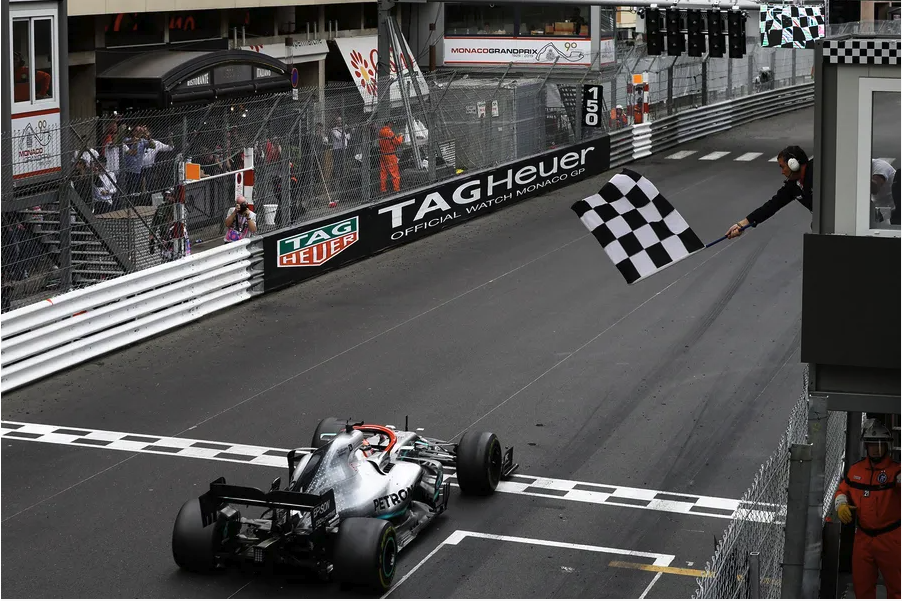

This analysis explored the causal impact of pit stop strategies on Formula 1 race performance using a combination of **Exploratory Data Analysis (EDA), Difference-in-Differences (DiD), and Instrumental Variables (IV) methodologies**.

The results emphasize the **critical importance of starting grid position**, which consistently demonstrated the strongest positive effect on finishing positions. Drivers starting in the top 10 grid positions showed significantly better outcomes, highlighting the importance of qualifying performance.

**Pit stop frequency** was found to have a generally negative impact on race performance. The DiD model revealed that additional pit stops worsen finishing positions, particularly in the later stages of the race. However, the interaction term suggested a slight mitigation of this negative effect in the post-event period, possibly due to fresher tires or strategic execution.

The IV model, using `Race_Encoded` as an instrument, accounted for the endogeneity of pit stops but showed an insignificant causal effect of pit stops on finishing positions. This suggests that unobserved factors such as tire degradation or driver skill may still influence the relationship, warranting further investigation.

EDA visualizations supported these findings, showing strong correlations between grid position and finishing results, moderate constructor influence, and variability in race-specific strategies. Drivers with fewer pit stops tended to perform better, aligning with the strategic importance of minimizing unnecessary stops.

In conclusion, the analysis demonstrates that optimizing qualifying performance and minimizing pit stops are key to race success. Constructor-specific strategies and race-specific factors also play crucial roles, suggesting teams must adapt their approaches based on track conditions and car performance. These insights provide a data-driven foundation for refining race strategies and improving performance in Formula 1.

# References:

- Harvard University: https://www.harvardonline.harvard.edu/course/causal-diagrams-draw-your-assumptions-your-conclusions
- Cornell University: Causality-based Feature Selection: Methods and Evaluations - https://arxiv.org/abs/1911.07147
- IEEE Xplore: Causal Feature Selection - https://ieeexplore.ieee.org/document/10302608
- https://towardsdatascience.com/causal-inference-for-data-scientists-part-1-f97fa8614143
- https://medium.com/causality-in-data-science/why-machine-learning-needs-causality-3d33e512cd37
- Wikipedia: https://en.wikipedia.org/wiki/Causal_inference

# License

MIT License

Copyright (c) 2024 Ritwik Giri

Permission is hereby granted, free of charge, to any person obtaining a copy
of this software and associated documentation files (the "Software"), to deal
in the Software without restriction, including without limitation the rights
to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
copies of the Software, and to permit persons to whom the Software is
furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all
copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE
SOFTWARE.